In [164]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, roc_auc_score
import numpy.random as npr
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from sklearn.neural_network import MLPRegressor


In [165]:
from google.colab import files
uploaded = files.upload()


In [166]:
df = pd.read_csv('airline_passenger_satisfaction.csv')

print(df.head())

   ID  Gender  Age Customer Type Type of Travel     Class  Flight Distance  \
0   1    Male   48    First-time       Business  Business              821   
1   2  Female   35     Returning       Business  Business              821   
2   3    Male   41     Returning       Business  Business              853   
3   4    Male   50     Returning       Business  Business             1905   
4   5  Female   49     Returning       Business  Business             3470   

   Departure Delay  Arrival Delay  Departure and Arrival Time Convenience  \
0                2            5.0                                       3   
1               26           39.0                                       2   
2                0            0.0                                       4   
3                0            0.0                                       2   
4                0            1.0                                       3   

   ...  On-board Service  Seat Comfort  Leg Room Service  Cleanlines

In [167]:
# Checking for missing values in each column
print("Count of missing values in each column before replacement:")
print(df.isnull().sum())

Count of missing values in each column before replacement:
ID                                          0
Gender                                      0
Age                                         0
Customer Type                               0
Type of Travel                              0
Class                                       0
Flight Distance                             0
Departure Delay                             0
Arrival Delay                             393
Departure and Arrival Time Convenience      0
Ease of Online Booking                      0
Check-in Service                            0
Online Boarding                             0
Gate Location                               0
On-board Service                            0
Seat Comfort                                0
Leg Room Service                            0
Cleanliness                                 0
Food and Drink                              0
In-flight Service                           0
In-flight Wifi Servic

In [168]:
# Replacing missing values with the mean for the 'Arrival Delay' from the result
df['Arrival Delay'].fillna(df['Arrival Delay'].mean(), inplace=True)

# Re-checking for missing values in each column after replacement
print("Count of missing values in each column after replacement:")
print(df.isnull().sum())

Count of missing values in each column after replacement:
ID                                        0
Gender                                    0
Age                                       0
Customer Type                             0
Type of Travel                            0
Class                                     0
Flight Distance                           0
Departure Delay                           0
Arrival Delay                             0
Departure and Arrival Time Convenience    0
Ease of Online Booking                    0
Check-in Service                          0
Online Boarding                           0
Gate Location                             0
On-board Service                          0
Seat Comfort                              0
Leg Room Service                          0
Cleanliness                               0
Food and Drink                            0
In-flight Service                         0
In-flight Wifi Service                    0
In-flight Entertai

/var/folders/8m/bs7t34sj2w71vsmtdl8hm8mw0000gn/T/ipykernel_42077/1558622499.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [169]:
dtypedf = df.dtypes
print(dtypedf)

ID                                          int64
Gender                                     object
Age                                         int64
Customer Type                              object
Type of Travel                             object
Class                                      object
Flight Distance                             int64
Departure Delay                             int64
Arrival Delay                             float64
Departure and Arrival Time Convenience      int64
Ease of Online Booking                      int64
Check-in Service                            int64
Online Boarding                             int64
Gate Location                               int64
On-board Service                            int64
Seat Comfort                                int64
Leg Room Service                            int64
Cleanliness                                 int64
Food and Drink                              int64
In-flight Service                           int64


In [170]:
## select nuermical cloumns and cleaned the data

numeric_df = df.select_dtypes(include=['int64', 'float64']).drop(columns=['ID'])

# Calculate the interquartile range (IQR) for each numerical column
Q1 = numeric_df.quantile(0.25)
Q3 = numeric_df.quantile(0.75)
IQR = Q3 - Q1
# Determine the threshold for outliers
outlier_threshold = 1.5
# Identify rows containing outliers in any numerical column
outliers = ((numeric_df < (Q1 - outlier_threshold * IQR)) | (numeric_df > (Q3 + outlier_threshold * IQR)))
# Count the number of outliers in each numerical column
outliers_count=outliers.sum()
print("Outliers count in each numerical columns:")
print(outliers_count)

Outliers count in each numerical columns:
Age                                           0
Flight Distance                            2855
Departure Delay                           18098
Arrival Delay                             17492
Departure and Arrival Time Convenience        0
Ease of Online Booking                        0
Check-in Service                          16109
Online Boarding                               0
Gate Location                                 0
On-board Service                              0
Seat Comfort                                  0
Leg Room Service                              0
Cleanliness                                   0
Food and Drink                                0
In-flight Service                             0
In-flight Wifi Service                        0
In-flight Entertainment                       0
Baggage Handling                              0
dtype: int64


In [172]:
# Remove rows containing outliers from the dataset
cleaned_df = df[~outliers.any(axis=1)]
cleaned_df.head()
print("cleaned dataframe shape:", cleaned_df.shape)
print("original dataframe shape:",df.shape)

cleaned dataframe shape: (93648, 24)
original dataframe shape: (129880, 24)


In [173]:
# Identify all categorical columns dtype='object'
categorical_columns = cleaned_df.select_dtypes(include=['object']).columns

In [174]:
# Instantiate a LabelEncoder to process categorical data
label_encoder = LabelEncoder()
columns = df[categorical_columns].apply(label_encoder.fit_transform)
for column in categorical_columns:
    encoded_column = label_encoder.fit_transform(cleaned_df[column])
    # Use assign to update the DataFrame
    cleaned_df = cleaned_df.assign(**{column: encoded_column})
cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 93648 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   ID                                      93648 non-null  int64  
 1   Gender                                  93648 non-null  int64  
 2   Age                                     93648 non-null  int64  
 3   Customer Type                           93648 non-null  int64  
 4   Type of Travel                          93648 non-null  int64  
 5   Class                                   93648 non-null  int64  
 6   Flight Distance                         93648 non-null  int64  
 7   Departure Delay                         93648 non-null  int64  
 8   Arrival Delay                           93648 non-null  float64
 9   Departure and Arrival Time Convenience  93648 non-null  int64  
 10  Ease of Online Booking                  93648 non-null  int64 

In [176]:
# take target variable out y（Satisfaction）
y = cleaned_df['Satisfaction']

# select dependent variables
X = cleaned_df.drop(columns=['Satisfaction'])

from sklearn.feature_selection import SelectKBest, f_classif
## use anova since the target varaible is catagorical
# select the top 10 features tht correlated the most with the target variable
selector = SelectKBest(score_func=f_classif, k=10)
X_new = selector.fit_transform(X, y)

# print the features
selected_features = X.columns[selector.get_support()]
print("Selected features:", selected_features)

Selected features: Index(['Type of Travel', 'Class', 'Flight Distance', 'Online Boarding',
       'On-board Service', 'Seat Comfort', 'Leg Room Service', 'Cleanliness',
       'In-flight Wifi Service', 'In-flight Entertainment'],
      dtype='object')


Features that we will look in to for EDA:


*   Type of Travel
*   Class
*   Flight Distance
*   Online Boarding
*   On-board Service
*   Seat Comfort
*   Leg Room Service
*   Cleanliness
*   In-flight Wifi Service
*   In-flight Entertainment


#DATA EXPLORATION


## correction of each features with the target varaible


Correlation scores of the top 10 features:
Online Boarding            0.508265
Type of Travel             0.487225
Class                      0.471642
In-flight Entertainment    0.390191
Seat Comfort               0.345562
Leg Room Service           0.313230
On-board Service           0.306936
Flight Distance            0.303749
Cleanliness                0.296636
In-flight Wifi Service     0.277998
Name: Satisfaction, dtype: float64


/var/folders/8m/bs7t34sj2w71vsmtdl8hm8mw0000gn/T/ipykernel_42077/396144493.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




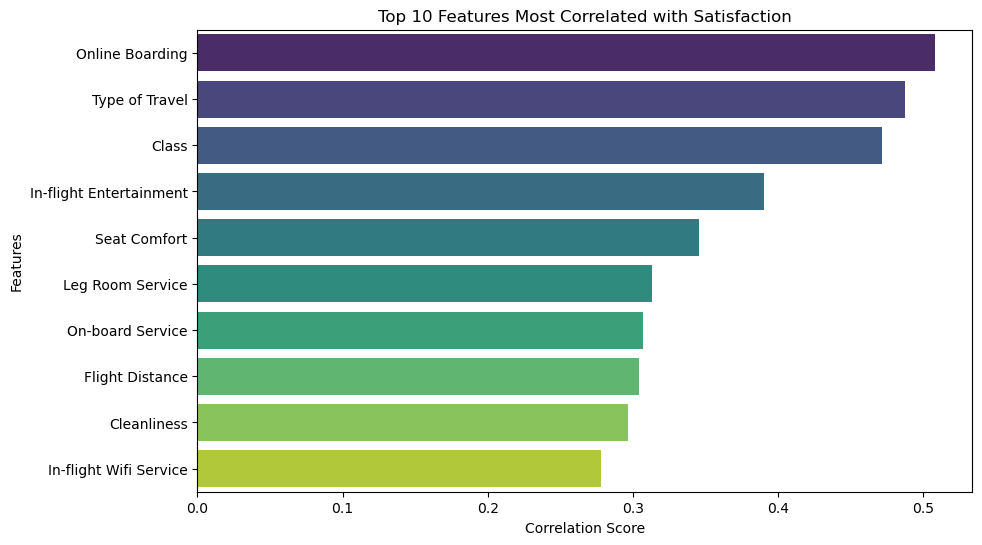

In [180]:

# # calcualte the correaltion between target variable and dependent variables
target_correlation = cleaned_df.corr()['Satisfaction'].abs().sort_values(ascending=False)

# print the correlation values with the selected features and target variable

top_10_correlation_scores = target_correlation[1:11]
print("\nCorrelation scores of the top 10 features:")
print(top_10_correlation_scores)

# visulization
plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_correlation_scores.values, y=top_10_correlation_scores.index, palette="viridis")
plt.title("Top 10 Features Most Correlated with Satisfaction")
plt.xlabel("Correlation Score")
plt.ylabel("Features")
plt.show()


##Segementation of passengers perference

/var/folders/8m/bs7t34sj2w71vsmtdl8hm8mw0000gn/T/ipykernel_42077/3311100091.py:19: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


/var/folders/8m/bs7t34sj2w71vsmtdl8hm8mw0000gn/T/ipykernel_42077/3311100091.py:19: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/var/folders/8m/bs7t34sj2w71vsmtdl8hm8mw0000gn/T/ipykernel_42077/3311100091.py:44: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


/var/folders/8m/bs7t34sj2w71vsmtdl8hm8mw0000gn/T/ipykernel_42077/3311100091.py:44: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




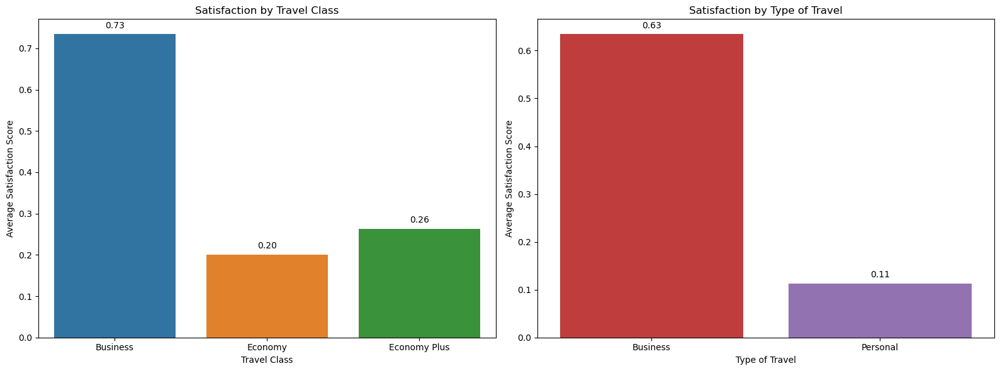

In [182]:

# Apply mappings using .loc to avoid SettingWithCopyWarning
cleaned_df.loc[:, 'Class Category'] = cleaned_df['Class'].map({0: 'Business', 1: 'Economy', 2: 'Economy Plus'})
cleaned_df.loc[:, 'Type of Travel Category'] = cleaned_df['Type of Travel'].map({0: 'Business', 1: 'Personal'})

# Ensure Satisfaction is numerical for plotting
if cleaned_df['Satisfaction'].dtype == 'object':
    cleaned_df['Satisfaction'] = cleaned_df['Satisfaction'].map({'satisfied': 1, 'dissatisfied': 0})

# Set up the matplotlib figure
fig, axes = plt.subplots(ncols=2, figsize=(16, 6))  # Two columns for each plot

# Custom colors for Travel Class
class_palette = {'Business': '#1f77b4', 'Economy': '#ff7f0e', 'Economy Plus': '#2ca02c'}

# Custom colors for Type of Travel
travel_palette = {'Business': '#d62728', 'Personal': '#9467bd'}

# Bar plot for satisfaction by Travel Class
bar1 = sns.barplot(
    x='Class Category',
    y='Satisfaction',
    data=cleaned_df,
    ax=axes[0],
    palette=class_palette.values(),  # Use custom colors
    estimator='mean',  # Calculate mean satisfaction
    ci=None  # Remove confidence intervals
)
axes[0].set_title('Satisfaction by Travel Class')
axes[0].set_xlabel('Travel Class')
axes[0].set_ylabel('Average Satisfaction Score')

# Add labels to the bars for Travel Class
for p in bar1.patches:
    bar1.annotate(
        format(p.get_height(), '.2f'),  # Format the score to 2 decimal places
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position of the label
        ha='center',  # Horizontal alignment
        va='center',  # Vertical alignment
        xytext=(0, 10),  # Offset for the label
        textcoords='offset points'
    )

# Bar plot for satisfaction by Type of Travel
bar2 = sns.barplot(
    x='Type of Travel Category',
    y='Satisfaction',
    data=cleaned_df,
    ax=axes[1],
    palette=travel_palette.values(),  # Use custom colors
    estimator='mean',  # Calculate mean satisfaction
    ci=None  # Remove confidence intervals
)
axes[1].set_title('Satisfaction by Type of Travel')
axes[1].set_xlabel('Type of Travel')
axes[1].set_ylabel('Average Satisfaction Score')

# Add labels to the bars for Type of Travel
for p in bar2.patches:
    bar2.annotate(
        format(p.get_height(), '.2f'),  # Format the score to 2 decimal places
        (p.get_x() + p.get_width() / 2., p.get_height()),  # Position of the label
        ha='center',  # Horizontal alignment
        va='center',  # Vertical alignment
        xytext=(0, 10),  # Offset for the label
        textcoords='offset points'
    )

# Improve layout to avoid overlap and display the plot
plt.tight_layout()
plt.show()

## Flight Distance

Summary Statistics for Flight Distance by Satisfaction Level:

                           count         mean          std   min    25%  \
Satisfaction                                                              
Neutral or Dissatisfied  73452.0   929.715420   791.293326  31.0  372.0   
Satisfied                56428.0  1529.539165  1127.596799  31.0  525.0   

                            50%     75%     max  
Satisfaction                                     
Neutral or Dissatisfied   674.0  1149.0  4983.0  
Satisfied                1249.0  2407.0  4983.0  


/var/folders/8m/bs7t34sj2w71vsmtdl8hm8mw0000gn/T/ipykernel_42077/67003256.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




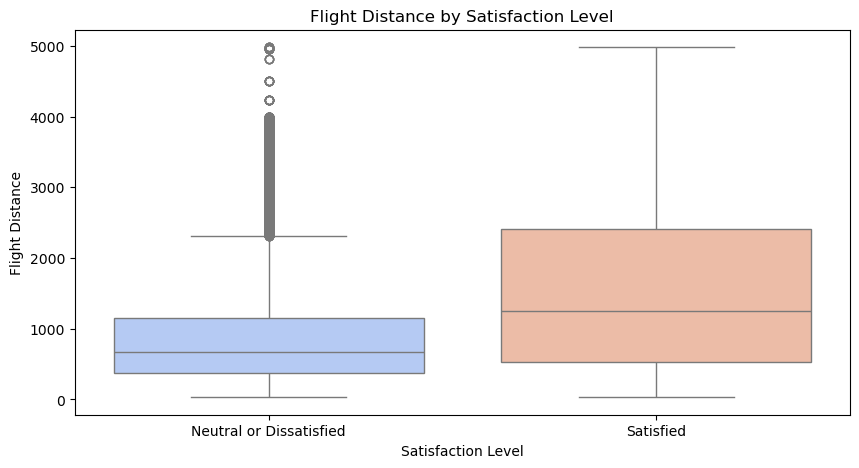

Summary Statistics for Cleanliness by Satisfaction Level:

                           count      mean       std  min  25%  50%  75%  max
Satisfaction                                                                 
Neutral or Dissatisfied  73452.0  2.932800  1.326273  0.0  2.0  3.0  4.0  5.0
Satisfied                56428.0  3.746509  1.143706  1.0  3.0  4.0  5.0  5.0


/var/folders/8m/bs7t34sj2w71vsmtdl8hm8mw0000gn/T/ipykernel_42077/67003256.py:25: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




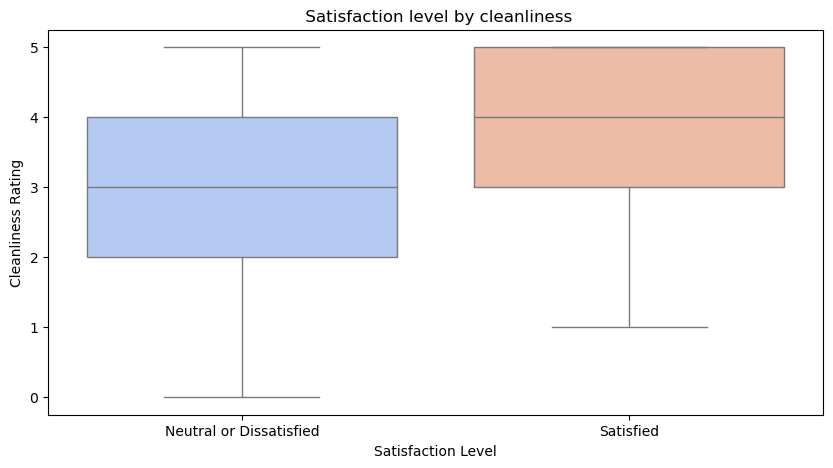

In [184]:
# Summary statistics for Flight Distance grouped by Satisfaction
satisfaction_stats_fd = df.groupby("Satisfaction")["Flight Distance"].describe()

# Print Summary Statistics
print("Summary Statistics for Flight Distance by Satisfaction Level:\n")
print(satisfaction_stats_fd)

# Boxplot: Flight Distance by Satisfaction level
plt.figure(figsize=(10, 5))
sns.boxplot(x="Satisfaction", y="Flight Distance", data=df, palette="coolwarm")
plt.title("Flight Distance by Satisfaction Level")
plt.xlabel("Satisfaction Level")
plt.ylabel("Flight Distance")
plt.show()

# Summary statistics for Cleanliness grouped by Satisfaction
satisfaction_stats_c = df.groupby("Satisfaction")["Cleanliness"].describe()

# Print Summary Statistics
print("Summary Statistics for Cleanliness by Satisfaction Level:\n")
print(satisfaction_stats_c)

# Boxplot: Satisfaction level by cleanliness
plt.figure(figsize=(10, 5))
sns.boxplot(x="Satisfaction", y="Cleanliness", data=df, palette="coolwarm")
plt.title(" Satisfaction level by cleanliness")
plt.xlabel("Satisfaction Level")
plt.ylabel("Cleanliness Rating")
plt.show()

##On board service and comfortableness

   Satisfaction         Service Feature  Rating
0           3.0  In-flight Wifi Service       2
1           3.0  In-flight Wifi Service       4
2           3.0  In-flight Wifi Service       2
3           3.0  In-flight Wifi Service       3
4           3.0  In-flight Wifi Service       4


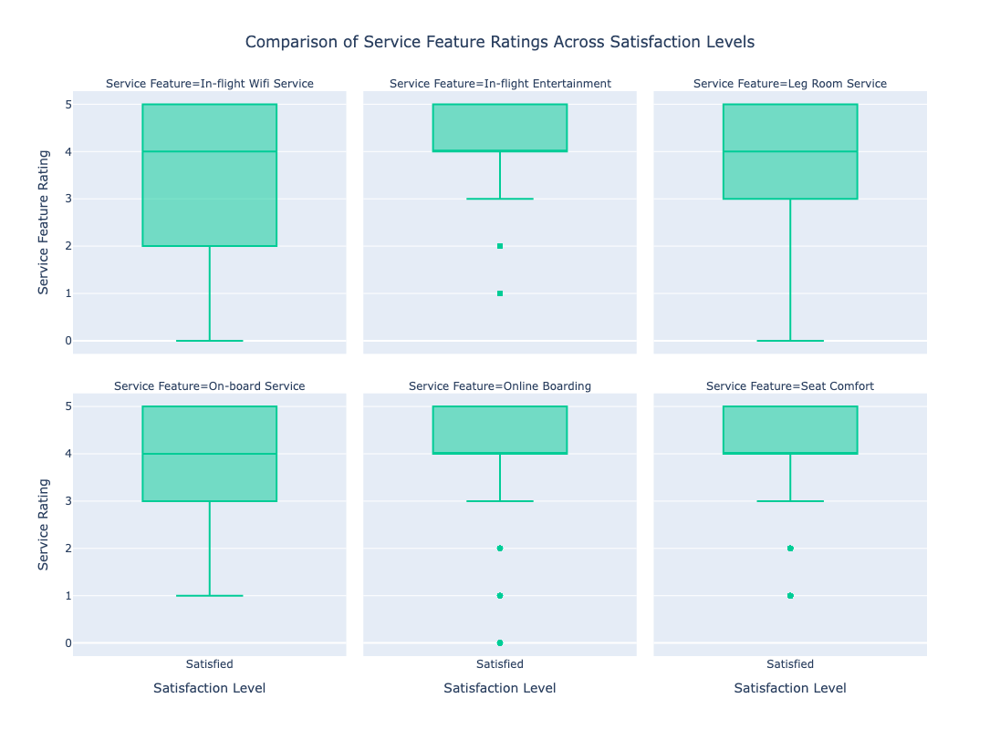

In [186]:
import pandas as pd
import plotly.express as px

# Define the list of service features
service_features = [
    'In-flight Wifi Service', 'In-flight Entertainment', 'Leg Room Service',
    'On-board Service', 'Online Boarding', 'Seat Comfort'
]

# Ensure Satisfaction column is in a consistent numeric format
satisfaction_mapping = {'Dissatisfied': 1, 'Neutral': 2, 'Satisfied': 3}
df['Satisfaction'] = df['Satisfaction'].map(satisfaction_mapping)

# Ensure features exist in df
service_features = [col for col in service_features if col in df.columns]

# Remove NaN satisfaction values
df_cleaned = df.dropna(subset=['Satisfaction'])

# Prepare the dataframe for easy use in Plotly
df_melted = df_cleaned.melt(id_vars=['Satisfaction'], value_vars=service_features,
                             var_name='Service Feature', value_name='Rating')

# Verify structure
print(df_melted.head())

# Convert Satisfaction back to categorical for visualization
satisfaction_reverse_mapping = {1: 'Dissatisfied', 2: 'Neutral', 3: 'Satisfied'}
df_melted['Satisfaction'] = df_melted['Satisfaction'].map(satisfaction_reverse_mapping)

# Create an interactive boxplot
fig = px.box(df_melted,
             x='Satisfaction',
             y='Rating',
             color='Satisfaction',
             facet_col='Service Feature',
             facet_col_wrap=3,
             category_orders={'Satisfaction': ['Dissatisfied', 'Neutral', 'Satisfied']},
             labels={'Satisfaction': 'Satisfaction Level', 'Rating': 'Service Feature Rating'},
             title="Comparison of Service Feature Ratings Across Satisfaction Levels")

# Update layout for better readability
fig.update_layout(
    height=800,
    width=1000,
    showlegend=False,
    title_x=0.5,
    title_y=0.95,
    xaxis_title="Satisfaction Level",
    yaxis_title="Service Rating",
    boxmode='group',
)

# Show the interactive plot
fig.show()

### Compare the percentage of satisfied vs. dissatisfied customers across different service levels.

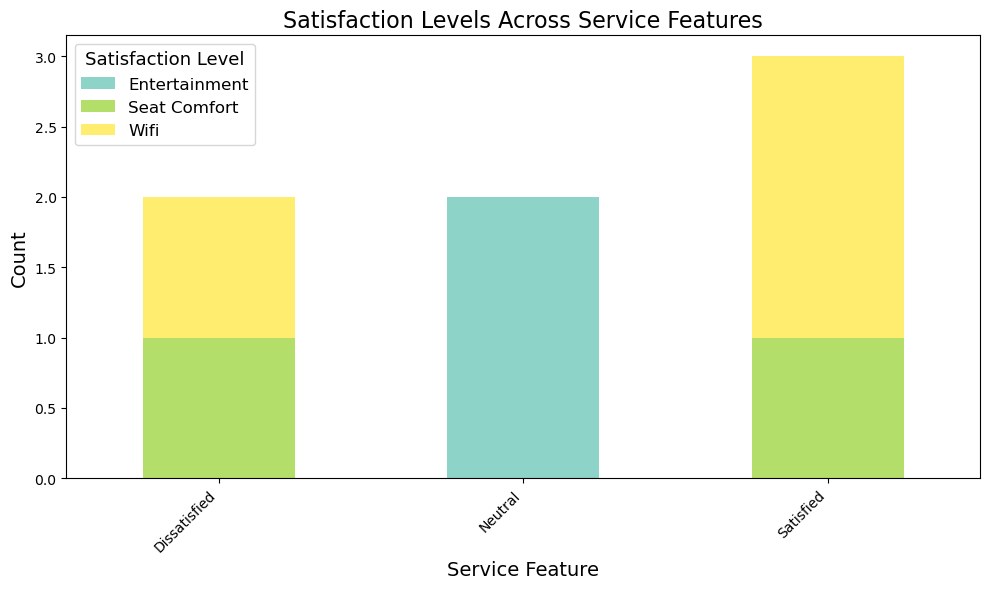

In [188]:
import pandas as pd
import matplotlib.pyplot as plt

# Example DataFrame with non-numeric (categorical) data
data = {
    'Satisfaction': ['Satisfied', 'Neutral', 'Dissatisfied', 'Neutral', 'Satisfied', 'Dissatisfied', 'Satisfied'],
    'Service Feature': ['Wifi', 'Entertainment', 'Wifi', 'Entertainment', 'Wifi', 'Seat Comfort', 'Seat Comfort']
}

df = pd.DataFrame(data)

# Group by 'Satisfaction' and 'Service Feature' to count occurrences
satisfaction_counts = df.groupby(['Satisfaction', 'Service Feature']).size().unstack(fill_value=0)

# Plotting the bar chart
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each satisfaction level as a separate bar (stacked)
satisfaction_counts.plot(kind='bar', stacked=True, ax=ax, colormap='Set3')

# Set plot labels and title
ax.set_title('Satisfaction Levels Across Service Features', fontsize=16)
ax.set_xlabel('Service Feature', fontsize=14)
ax.set_ylabel('Count', fontsize=14)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.legend(title='Satisfaction Level', title_fontsize='13', fontsize='12')

# Show the plot
plt.tight_layout()
plt.show()

## Opertional Efficiency

/var/folders/8m/bs7t34sj2w71vsmtdl8hm8mw0000gn/T/ipykernel_42077/287169131.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/var/folders/8m/bs7t34sj2w71vsmtdl8hm8mw0000gn/T/ipykernel_42077/287169131.py:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




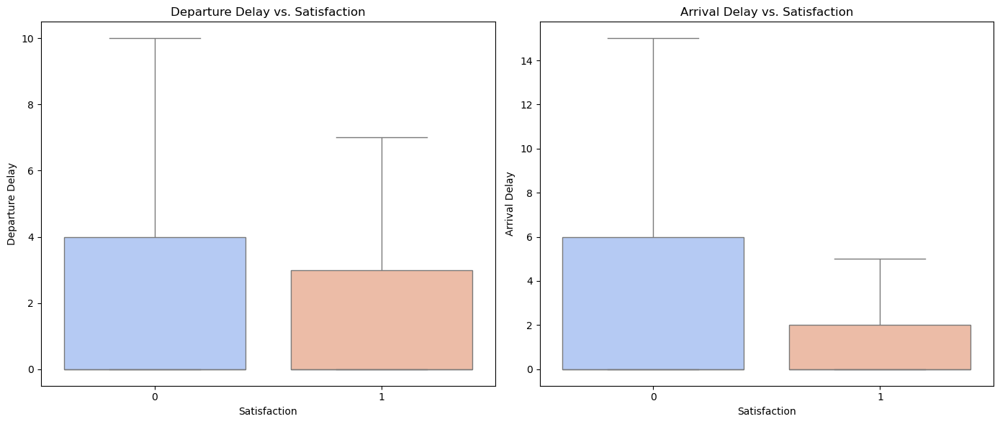

In [248]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the plot with subplots to compare Departure Delay and Arrival Delay
plt.figure(figsize=(14, 6))

# Plot for Departure Delay vs Satisfaction
plt.subplot(1, 2, 1)
sns.boxplot(x='Satisfaction', y='Departure Delay', data=cleaned_df, showfliers=False, palette='coolwarm')
plt.title("Departure Delay vs. Satisfaction")

# Plot for Arrival Delay vs Satisfaction
plt.subplot(1, 2, 2)
sns.boxplot(x='Satisfaction', y='Arrival Delay', data=cleaned_df, showfliers=False, palette='coolwarm')
plt.title("Arrival Delay vs. Satisfaction")

# Display the plots
plt.tight_layout()
plt.show()

# Predictive modelling

In [192]:
# so we use the select featueres to build our model
X = X_new
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


## Logistic Regression

Logistic Regression Model Accuracy: 0.817369638725752
Confusion Matrix:
 [[11872  3083]
 [ 2048 11092]]
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.79      0.82     14955
           1       0.78      0.84      0.81     13140

    accuracy                           0.82     28095
   macro avg       0.82      0.82      0.82     28095
weighted avg       0.82      0.82      0.82     28095



/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



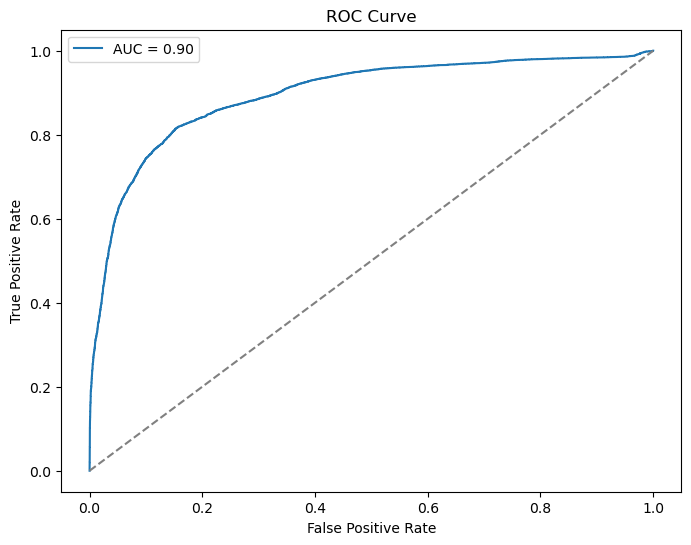

In [194]:
###  Logistic Regression

# create the model
model = LogisticRegression()

# fit the the model on training data
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Evaluate the regression's performance
logtistic_regression_accuracy = accuracy_score(y_test, y_pred)
print("Logistic Regression Model Accuracy:", logtistic_regression_accuracy)


conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)


class_report = classification_report(y_test, y_pred)
print("Classification Report:\n", class_report)

# Predict probabilities for the positive class
y_pred_proba = model.predict_proba(X_test)[:, 1]

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
auc_score = roc_auc_score(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AUC = {auc_score:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

## Decision tree

Decisicon Tree Classfier Accuracy: 0.9197366079373555
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.93      0.92     14955
           1       0.92      0.91      0.91     13140

    accuracy                           0.92     28095
   macro avg       0.92      0.92      0.92     28095
weighted avg       0.92      0.92      0.92     28095



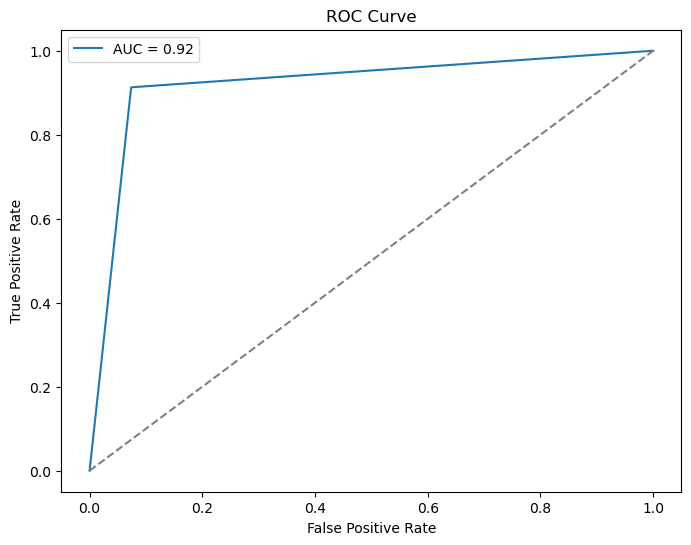

In [196]:
## decision tree
from sklearn.tree import DecisionTreeClassifier

model = DecisionTreeClassifier()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

decision_tree_accuracy = accuracy_score(y_test, y_pred)
print("Decisicon Tree Classfier Accuracy:", decision_tree_accuracy)

class_report = classification_report(y_test, y_pred)
print("Classification Report:\n", class_report)

# Predict probabilities for the positive class
y_pred_proba = model.predict_proba(X_test)[:, 1]

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
auc_score = roc_auc_score(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AUC = {auc_score:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

## Random forest


In [198]:
## random forest

from sklearn.ensemble import RandomForestClassifier

#Create and train a Random Forest classifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

#Evaluate the classifier on the test set
y_pred = rf.predict(X_test)
random_forest_test_accuracy = accuracy_score(y_test, y_pred)
print("Random Forest Accuracy:", random_forest_test_accuracy)
#Evaluating Random Forest Model
print("Random Forest Model Classification Report for test set:\n", classification_report(y_test, y_pred))



Random Forest Accuracy: 0.9355401316960313
Random Forest Model Classification Report for test set:
               precision    recall  f1-score   support

           0       0.93      0.95      0.94     14955
           1       0.94      0.92      0.93     13140

    accuracy                           0.94     28095
   macro avg       0.94      0.93      0.94     28095
weighted avg       0.94      0.94      0.94     28095



Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.95      0.94     14955
           1       0.94      0.92      0.93     13140

    accuracy                           0.94     28095
   macro avg       0.94      0.93      0.94     28095
weighted avg       0.94      0.94      0.94     28095



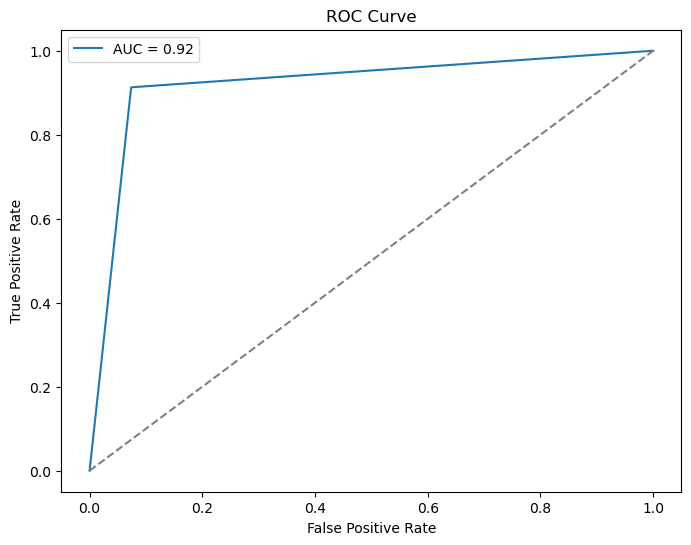

Random Forest Accuracy: 0.9355401316960313


In [199]:
class_report = classification_report(y_test, y_pred)
print("Classification Report:\n", class_report)

# Predict probabilities for the positive class
y_pred_proba = model.predict_proba(X_test)[:, 1]

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
auc_score = roc_auc_score(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AUC = {auc_score:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

print("Random Forest Accuracy:", random_forest_test_accuracy)

Length of importances: 10
Indices array: [3 8 1 2 0 9 6 5 4 7]
Sorted Feature Names (by importance):
Online Boarding: 0.2171
In-flight Wifi Service: 0.1907
Class: 0.1238
Flight Distance: 0.1192
Type of Travel: 0.1127
In-flight Entertainment: 0.0742
Leg Room Service: 0.0498
Seat Comfort: 0.0429
On-board Service: 0.0394
Cleanliness: 0.0302


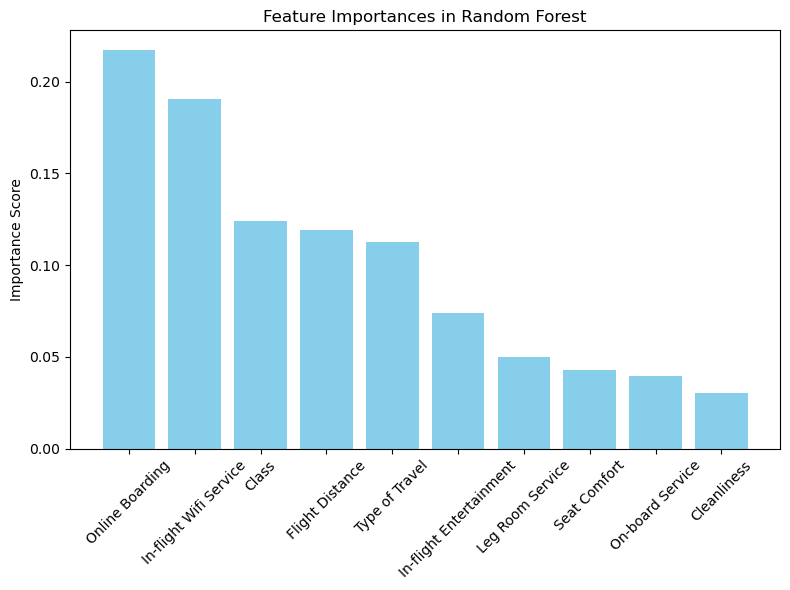

In [200]:

# X is a NumPy array and selected_features is available
feature_names = selected_features.tolist()  # Use selected_features to define feature_names

# Create and train a Random Forest classifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Extract feature importances from the trained model
importances = rf.feature_importances_
print("Length of importances:", len(importances))

# Get indices that would sort the importances in descending order
indices = np.argsort(importances)[::-1]
print("Indices array:", indices)

# Get the sorted feature names from the sorted indices
sorted_feature_names = [feature_names[i] for i in indices]

# Print the sorted feature names along with their importance scores
print("Sorted Feature Names (by importance):")
for name, importance in zip(sorted_feature_names, importances[indices]):
    print(f"{name}: {importance:.4f}")

# Plot the feature importances with feature names as labels
plt.figure(figsize=(8, 6))
plt.title("Feature Importances in Random Forest")
plt.bar(range(X.shape[1]), importances[indices], color="skyblue", align="center")
plt.xticks(range(X.shape[1]), [feature_names[i] for i in indices], rotation=45)
plt.ylabel("Importance Score")
plt.tight_layout()
plt.show()

## KNN

In [202]:
# Train KNN model with k=5 (we will tune this later)
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

# Predictions
y_pred = knn.predict(X_test)
knn_accuracy = accuracy_score(y_test, y_pred)
# Evaluate Performance
print("Accuracy:", knn_accuracy)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8555258942872397
Confusion Matrix:
 [[13398  1557]
 [ 2502 10638]]
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.90      0.87     14955
           1       0.87      0.81      0.84     13140

    accuracy                           0.86     28095
   macro avg       0.86      0.85      0.85     28095
weighted avg       0.86      0.86      0.86     28095



### optimal K

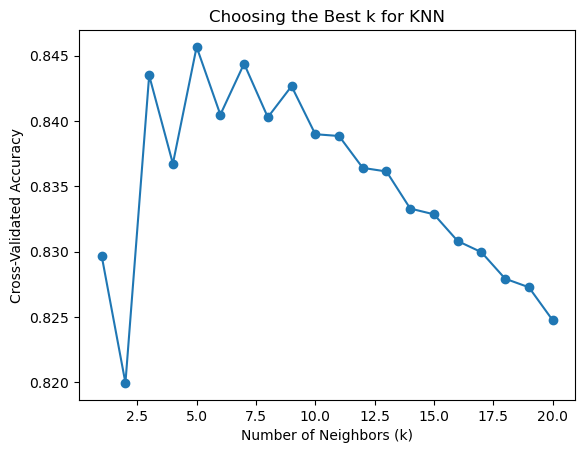

In [204]:
from sklearn.model_selection import cross_val_score
# Try different k values
k_values = range(1, 21)
scores = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    score = cross_val_score(knn, X_train, y_train, cv=5, scoring='accuracy').mean()
    scores.append(score)

# Plot accuracy vs. k
plt.plot(k_values, scores, marker='o')
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Cross-Validated Accuracy")
plt.title("Choosing the Best k for KNN")
plt.show()

## Neutral Network

In [206]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.utils import to_categorical
from keras.callbacks import EarlyStopping
# Initialize the StandardScaler
scaler = StandardScaler()
# Scale the training and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Model Definition
# Define a Sequential model for binary classification
model = Sequential([
    Input(shape=(X_train_scaled.shape[1],)),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(64, activation='relu'),
    Dropout(0.2),
    Dense(1, activation='sigmoid')
])

# Model Compilation
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Early Stopping Configuration
early_stopping_monitor = EarlyStopping(
    monitor='val_loss',
    patience=5,
    verbose=1,
    restore_best_weights=True
)

# Model Training
# Fit the model with early stopping to avoid overfitting.
history = model.fit(
    X_train_scaled, y_train,
    epochs=100,
    batch_size=10,
    verbose=1,
    validation_split=0.2,
    callbacks=[early_stopping_monitor]  # Include early stopping in the training process
)

# Calculate accuracy on test sets
loss, accuracy = model.evaluate(X_test_scaled, y_test, verbose=0)
sequential_neural_network_test_accuracy = accuracy

print("Accuracy of Sequential Neural Network Model on the test set:", accuracy)
print("{:.2%}".format(accuracy), "of the test instances were correctly classified.")

# Generate predictions for the test set
y_pred = model.predict(X_test_scaled)
# Convert the predictions to binary labels
y_pred_binary = (y_pred > 0.5).astype(int)

# Print classification report
print("Sequential Neural Network Model Classification Report for test set:\n", classification_report(y_test, y_pred_binary))

Epoch 1/100
5245/5245 ━━━━━━━━━━━━━━━━━━━━ 2s 346us/step - accuracy: 0.8867 - loss: 0.2799 - val_accuracy: 0.9259 - val_loss: 0.1784
Epoch 2/100
5245/5245 ━━━━━━━━━━━━━━━━━━━━ 2s 342us/step - accuracy: 0.9251 - loss: 0.1810 - val_accuracy: 0.9301 - val_loss: 0.1656
Epoch 3/100
5245/5245 ━━━━━━━━━━━━━━━━━━━━ 2s 337us/step - accuracy: 0.9291 - loss: 0.1709 - val_accuracy: 0.9336 - val_loss: 0.1582
Epoch 4/100
5245/5245 ━━━━━━━━━━━━━━━━━━━━ 2s 338us/step - accuracy: 0.9303 - loss: 0.1654 - val_accuracy: 0.9346 - val_loss: 0.1539
Epoch 5/100
5245/5245 ━━━━━━━━━━━━━━━━━━━━ 2s 337us/step - accuracy: 0.9334 - loss: 0.1599 - val_accuracy: 0.9374 - val_loss: 0.1522
Epoch 6/100
5245/5245 ━━━━━━━━━━━━━━━━━━━━ 2s 376us/step - accuracy: 0.9360 - loss: 0.1550 - val_accuracy: 0.9372 - val_loss: 0.1510
Epoch 7/100
5245/5245 ━━━━━━━━━━━━━━━━━━━━ 2s 390us/step - accuracy: 0.9358 - loss: 0.1540 - val_accuracy: 0.9362 - val_loss: 0.1485
Epoch 8/100
5245/5245 ━━━━━━━━━━━━━━━━━━━━ 2s 369us/step - accuracy: 

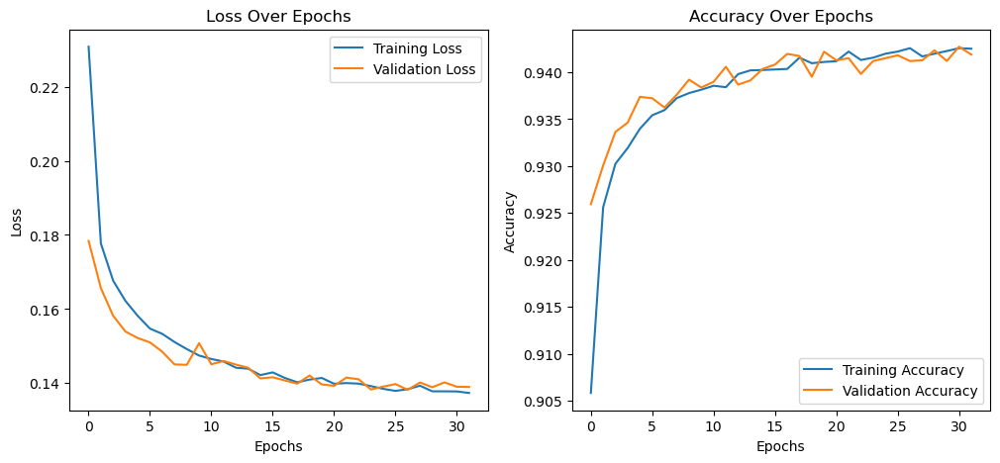

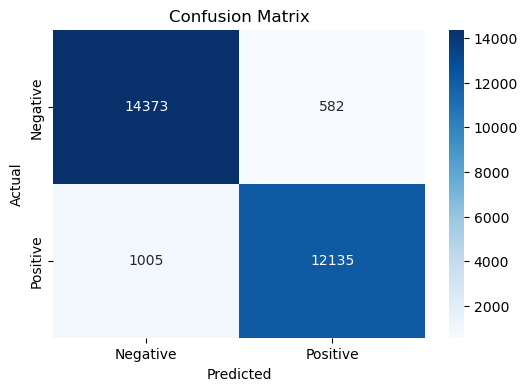

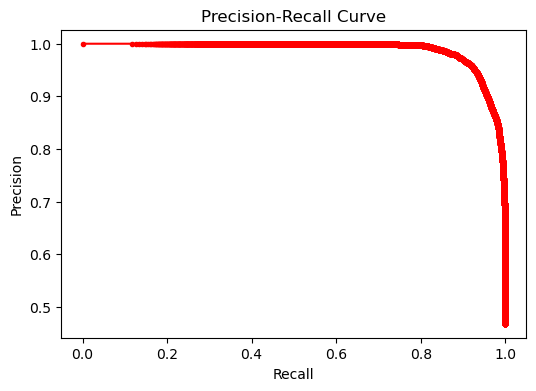

In [207]:
import matplotlib.pyplot as plt

# Plot training & validation loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()

# Plot training & validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')
plt.legend()

plt.show()

import seaborn as sns
from sklearn.metrics import confusion_matrix

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred_binary)

# Plot the heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

from sklearn.metrics import precision_recall_curve

precision, recall, _ = precision_recall_curve(y_test, y_pred)

plt.figure(figsize=(6, 4))
plt.plot(recall, precision, marker='.', color='red')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

## Models comparison

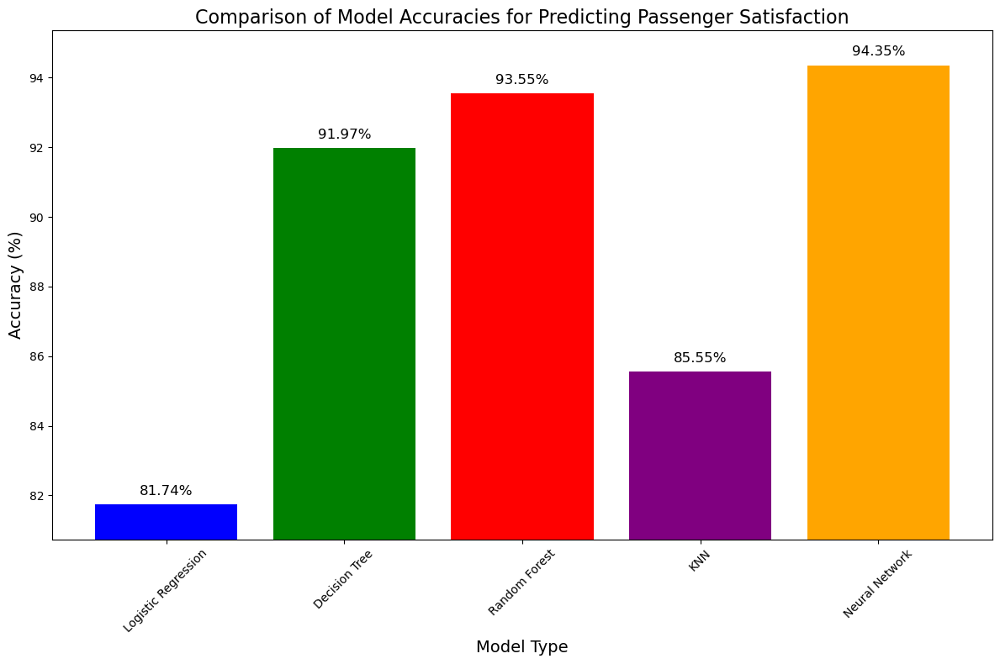

In [209]:
# list accuracy values obtained from the different models
model_names = ['Logistic Regression', 'Decision Tree', 'Random Forest','KNN', 'Neural Network']
accuracies = [round(accuracy * 100, 2) for accuracy in [
    logtistic_regression_accuracy,
    decision_tree_accuracy,
    random_forest_test_accuracy,
    knn_accuracy,
    sequential_neural_network_test_accuracy
]]


# Creating the bar chart
plt.figure(figsize=(12, 8))  # Larger figure size
plt.bar(model_names, accuracies, color=['blue', 'green', 'red', 'purple', 'orange'])  # Corrected color list

# Adding text labels for each bar
for i, accuracy in enumerate(accuracies):
    plt.text(i, accuracy + 0.2, f'{accuracy:.2f}%', ha='center', va='bottom', fontsize=12)

# Labels and title
plt.xlabel('Model Type', fontsize=14)
plt.ylabel('Accuracy (%)', fontsize=14)
plt.title('Comparison of Model Accuracies for Predicting Passenger Satisfaction', fontsize=16)

# Adjusting Y-axis range for better visualization
plt.ylim([min(accuracies) - 1, max(accuracies) + 1])  # Dynamic y-axis range

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

